# Looking at GM coefficients in ACCESS-OM3

**This notebooke details efforts to test the GM implementation in the 25km beta-1.0 release of ACCESS-OM3  (AH - 27/1/26)**

The script analyses the following simulations:


| Branch | Full name | description | 
|--------|---------|--------|
| 1.0-beta |  MC_25km_jra_iaf-1.0-beta-5165c0f8 | IAF control of current latest release | 
| 1.0-beta-gm1	| MC_25km_jra_iaf-1.0-beta-gm1-d968c801	| Same as above, but with MEKE_KHTH_FAC, MEKE_KHTR_FAC & MEKE_VISCOSITY_COEFF_KU to zero, as per OM5 config. Goes for about 30 years.| 
| 1.0-beta-gm2	| MC_25km_jra_iaf-1.0-beta-gm2-5dc49da6	 | Not using MEKE, setting GM as vertically and latitudinally varying (but not flow-dependent) and a max of 200 m^2/s | 
| 1.0-beta-gm3	| MC_25km_jra_iaf-1.0-beta-gm3-da330542	| Same as 1.0-beta, but with MEKE_KHTH_FAC = 0.2, MEKE_KHTR_FAC = 0.2, MEKE_VISCOSITY_COEFF_KU = 0.4| 
| 1.0-beta-gm4	| MC_25km_jra_iaf-1.0-beta-gm4-9fd08880	| Same as 1.0-beta, but with MEKE_KHTH_FAC = 0.3, MEKE_KHTR_FAC = 0.3, MEKE_VISCOSITY_COEFF_KU = 0.6| 
| 1.0-beta-gm5	| MC_25km_jra_iaf-1.0-beta-gm5-9b5dbfa9	| Same as gm4, but with MEKE_VISCOSITY_COEFF_KU = -0.1. The idea is that this might create a backscatter effect which improves separatin biases.| 

**The overall recommendation is that the parameters used in `1.0-beta-gm4` are best out of the options tested here.**


In [1]:
#This cell must be in all notebooks!
#It allows us to run all the notebooks at once, this cell has a tag "parameters" which allows us to pass in 
# arguments externally using papermill (see mkfigs.sh for details)

### USER EDIT start
esm_file='/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf-1.0-beta-5165c0f8/datastore.json'
esm_gm1='/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf-1.0-beta-gm1-d968c801/datastore.json'
esm_gm2='/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf-1.0-beta-gm2-5dc49da6/datastore.json'
esm_gm3='/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf-1.0-beta-gm3-da330542/datastore.json'
esm_gm4='/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf-1.0-beta-gm4-9fd08880/datastore.json'
esm_gm5='/g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf-1.0-beta-gm5-9b5dbfa9/datastore.json'
dpi=300
### USER EDIT stop

import os
from matplotlib import rcParams
%matplotlib inline
rcParams["figure.dpi"]= dpi

plotfolder=f"/g/data/{os.environ['PROJECT']}/{os.environ['USER']}/access-om3-paper-figs/"
os.makedirs(plotfolder, exist_ok=True)

 # a similar cell under this means it's being run in batch
print("ESM datastore path: ",esm_file)
print("Plot folder path: ",plotfolder)

ESM datastore path:  /g/data/ol01/outputs/access-om3-25km/MC_25km_jra_iaf-1.0-beta-5165c0f8/datastore.json
Plot folder path:  /g/data/x77/amh157/access-om3-paper-figs/


In [2]:
IAF = esm_file.find('iaf') > 0
IAF

True

In [3]:
import xarray as xr
import cf_xarray
import intake
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
from distributed import Client
import cftime
import cmocean as cm

In [4]:
client = Client(threads_per_worker=1)
print(client.dashboard_link)

/proxy/8787/status


### Open the intake-esm datastore

In [5]:
COLUMNS_WITH_ITERABLES = [
        "variable",
        "variable_long_name",
        "variable_standard_name",
        "variable_cell_methods",
        "variable_units"
]

datastore = intake.open_esm_datastore(
    esm_file,
    columns_with_iterables=COLUMNS_WITH_ITERABLES
)

datastore_gm1 = intake.open_esm_datastore(
    esm_gm1,
    columns_with_iterables=COLUMNS_WITH_ITERABLES
)

datastore_gm2 = intake.open_esm_datastore(
    esm_gm2,
    columns_with_iterables=COLUMNS_WITH_ITERABLES
)

datastore_gm3 = intake.open_esm_datastore(
    esm_gm3,
    columns_with_iterables=COLUMNS_WITH_ITERABLES
)

datastore_gm4 = intake.open_esm_datastore(
    esm_gm4,
    columns_with_iterables=COLUMNS_WITH_ITERABLES
)
datastore_gm5 = intake.open_esm_datastore(
    esm_gm5,
    columns_with_iterables=COLUMNS_WITH_ITERABLES
)

### What ocean variables are available at monthly frequency?

In [6]:
def available_variables(datastore):
    """Return a pandas dataframe summarising the variables in a datastore"""
    variable_columns = [col for col in datastore.df.columns if "variable" in col]
    return (
        datastore.df[variable_columns]
        .explode(variable_columns)
        .drop_duplicates()
        .set_index("variable")
        .sort_index()
    )

In [7]:
datastore_filtered = datastore.search(realm="ocean", frequency="1mon", variable="zossq")

available_variables(datastore_filtered)

,variable_long_name,variable_standard_name,variable_cell_methods,variable_units
variable,,,,
average_DT,Length of average period,,,days
average_T1,Start time for average period,,,days since 1900-01-01 00:00:00
average_T2,End time for average period,,,days since 1900-01-01 00:00:00
nv,vertex number,,,
time,time,,,days since 1900-01-01 00:00:00
time_bnds,time axis boundaries,,,days since 1900-01-01 00:00:00
xh,h point nominal longitude,,,degrees_east
yh,h point nominal latitude,,,degrees_north
zossq,Square of sea surface height above geoid,square_of_sea_surface_height_above_geoid,area:mean yh:mean xh:mean time: mean,m2


**Testing diagnostic variables. Note that `diftrelo` and `diftrblo` are the Redi & GM coefficients respectively. We can ignore the other KHTH variables.**

# Comparison with ACCESS-OM2
The image below is from ACCESS-OM2. So, the GM & Redi correficients are much stronger in ACCESS-OM3 ...

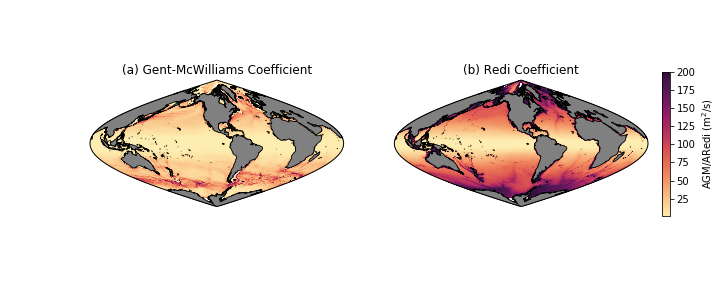

# Comparison between ACCESS-OM3 cases

In [8]:
diftrblo = datastore.search(variable="diftrblo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)
diftrblo_gm1 = datastore_gm1.search(variable="diftrblo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)

diftrblo_gm2 = datastore_gm2.search(variable="diftrblo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)

diftrblo_gm3 = datastore_gm3.search(variable="diftrblo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)

diftrblo_gm4 = datastore_gm4.search(variable="diftrblo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)

diftrblo_gm5 = datastore_gm5.search(variable="diftrblo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)

/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. 

## Look at magnitude of GM and Redi coefficients

Text(0.5, 0, 'GM [m^2/s]')

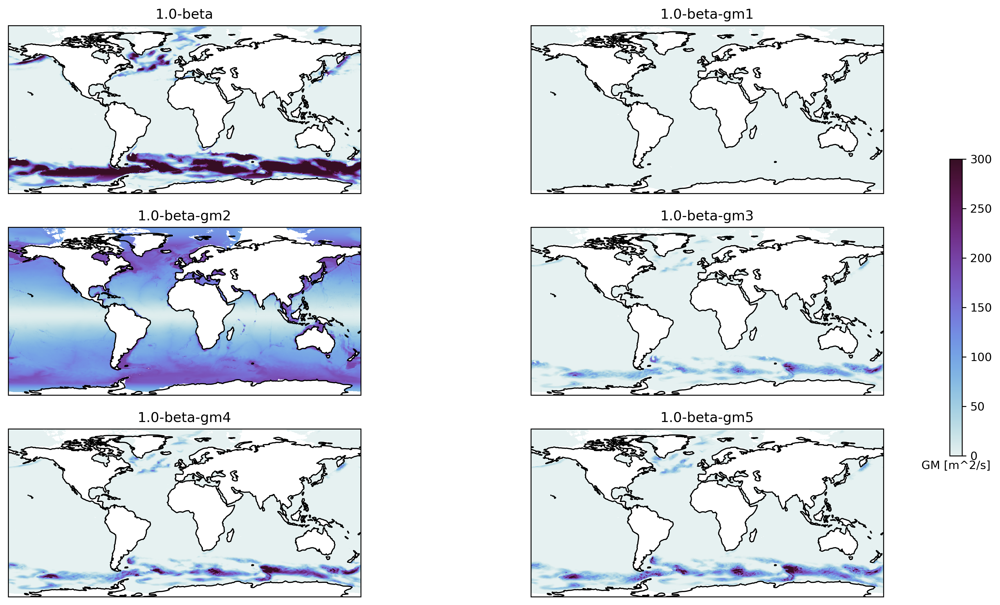

In [9]:
proj = ccrs.PlateCarree()
fig, ax = plt.subplots(3,2,figsize=(15,9), subplot_kw=dict(projection=proj))

p1 = diftrblo["diftrblo"].isel(time=-1).isel(zl=0).plot(ax=ax[0,0],vmin=0,vmax=300,add_colorbar=False,cmap=cm.cm.dense)
ax[0,0].coastlines()
ax[0,0].set_title('1.0-beta')

diftrblo_gm1["diftrblo"].isel(time=-1).isel(zl=0).plot(ax=ax[0,1],vmin=0,vmax=300,add_colorbar=False,cmap=cm.cm.dense)
ax[0,1].coastlines()
ax[0,1].set_title('1.0-beta-gm1')


diftrblo_gm2["diftrblo"].isel(time=-1).isel(zl=0).plot(ax=ax[1,0],vmin=0,vmax=300,add_colorbar=False,cmap=cm.cm.dense)
ax[1,0].coastlines()
ax[1,0].set_title('1.0-beta-gm2')


diftrblo_gm3["diftrblo"].isel(time=-1).isel(zl=0).plot(ax=ax[1,1],vmin=0,vmax=300,add_colorbar=False,cmap=cm.cm.dense)
ax[1,1].coastlines()
ax[1,1].set_title('1.0-beta-gm3')


diftrblo_gm4["diftrblo"].isel(time=-1).isel(zl=0).plot(ax=ax[2,0],vmin=0,vmax=300,add_colorbar=False,cmap=cm.cm.dense)
ax[2,0].coastlines()
ax[2,0].set_title('1.0-beta-gm4')


diftrblo_gm5["diftrblo"].isel(time=-1).isel(zl=0).plot(ax=ax[2,1],vmin=0,vmax=300,add_colorbar=False,cmap=cm.cm.dense)
ax[2,1].coastlines()
ax[2,1].set_title('1.0-beta-gm5')

ax_c = plt.axes([0.92,0.3,0.01,0.4])
pc = plt.colorbar(p1,ax_c)
plt.xlabel('GM [m^2/s]')

In [10]:
diftrelo = datastore.search(variable="diftrelo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)
diftrelo_gm1 = datastore_gm1.search(variable="diftrelo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)

diftrelo_gm2 = datastore_gm2.search(variable="diftrelo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)

diftrelo_gm3 = datastore_gm3.search(variable="diftrelo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)


diftrelo_gm4 = datastore_gm4.search(variable="diftrelo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)

diftrelo_gm5 = datastore_gm5.search(variable="diftrelo", frequency="1mon").to_dask(
    xarray_combine_by_coords_kwargs = dict( # These kwargs can make things faster
        compat="override",
        data_vars="minimal",
        coords="minimal",
    ),
    xarray_open_kwargs = dict(
        chunks={"yh": -1, "xh": -1}, # Good for spatial operations, but not temporal
        decode_timedelta=True
    )
)

/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. 

Text(0.5, 0, 'Redi [m^2/s]')

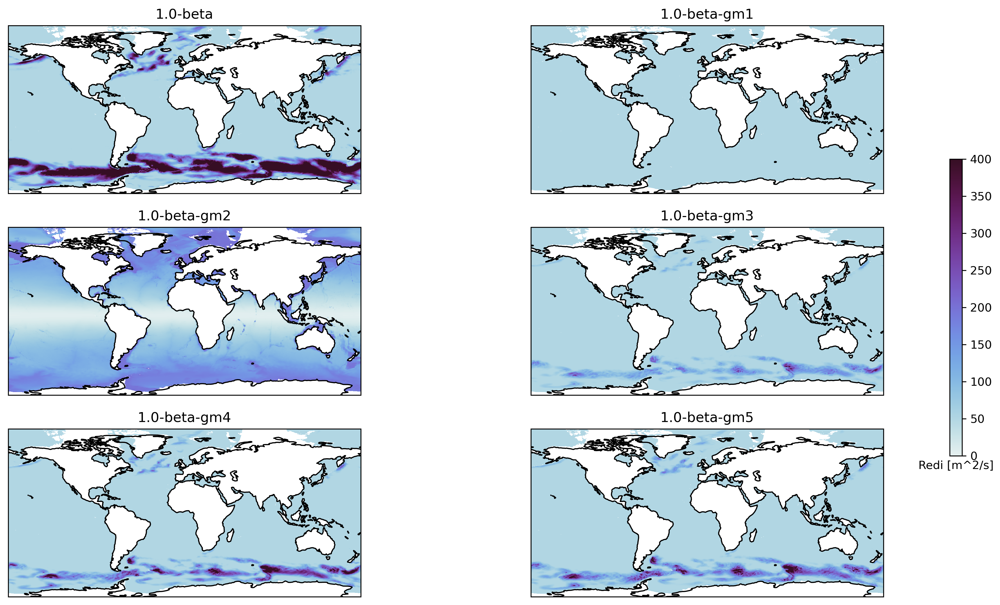

In [11]:
proj = ccrs.PlateCarree()
fig, ax = plt.subplots(3,2,figsize=(15,9), subplot_kw=dict(projection=proj))

p2=diftrelo["diftrelo"].isel(time=-1).isel(zi=0).plot(ax=ax[0,0],vmin=0,vmax=400,add_colorbar=False,cmap=cm.cm.dense)
ax[0,0].coastlines()
ax[0,0].set_title('1.0-beta')

diftrelo_gm1["diftrelo"].isel(time=-1).isel(zi=0).plot(ax=ax[0,1],vmin=0,vmax=400,add_colorbar=False,cmap=cm.cm.dense)
ax[0,1].coastlines()
ax[0,1].set_title('1.0-beta-gm1')


diftrelo_gm2["diftrelo"].isel(time=-1).isel(zi=0).plot(ax=ax[1,0],vmin=0,vmax=400,add_colorbar=False,cmap=cm.cm.dense)
ax[1,0].coastlines()
ax[1,0].set_title('1.0-beta-gm2')


diftrelo_gm3["diftrelo"].isel(time=-1).isel(zi=0).plot(ax=ax[1,1],vmin=0,vmax=400,add_colorbar=False,cmap=cm.cm.dense)
ax[1,1].coastlines()
ax[1,1].set_title('1.0-beta-gm3')


diftrelo_gm4["diftrelo"].isel(time=-1).isel(zi=0).plot(ax=ax[2,0],vmin=0,vmax=400,add_colorbar=False,cmap=cm.cm.dense)
ax[2,0].coastlines()
ax[2,0].set_title('1.0-beta-gm4')


diftrelo_gm5["diftrelo"].isel(time=-1).isel(zi=0).plot(ax=ax[2,1],vmin=0,vmax=400,add_colorbar=False,cmap=cm.cm.dense)
ax[2,1].coastlines()
ax[2,1].set_title('1.0-beta-gm5')

ax_c = plt.axes([0.92,0.3,0.01,0.4])
pc = plt.colorbar(p2,ax_c)
plt.xlabel('Redi [m^2/s]')

Text(0.5, 1.0, 'GM')

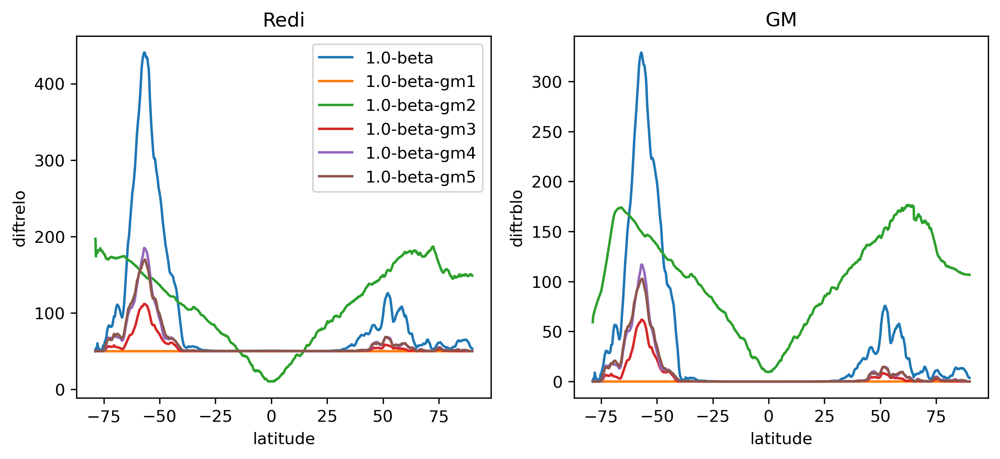

In [12]:
fig, ax = plt.subplots(1,2,figsize=(10,4))
diftrelo["diftrelo"].isel(time=-1).isel(zi=0).mean('xh').plot(ax=ax[0],label='1.0-beta')
diftrelo_gm1["diftrelo"].isel(time=-1).isel(zi=0).mean('xh').plot(ax=ax[0],label='1.0-beta-gm1')
diftrelo_gm2["diftrelo"].isel(time=-1).isel(zi=0).mean('xh').plot(ax=ax[0],label='1.0-beta-gm2')
diftrelo_gm3["diftrelo"].isel(time=-1).isel(zi=0).mean('xh').plot(ax=ax[0],label='1.0-beta-gm3')
diftrelo_gm4["diftrelo"].isel(time=-1).isel(zi=0).mean('xh').plot(ax=ax[0],label='1.0-beta-gm4')
diftrelo_gm5["diftrelo"].isel(time=-1).isel(zi=0).mean('xh').plot(ax=ax[0],label='1.0-beta-gm5')
ax[0].legend()
ax[0].set_xlabel('latitude')
ax[0].set_title('Redi')

diftrblo["diftrblo"].isel(time=-1).isel(zl=0).mean('xh').plot(ax=ax[1],label='1.0-beta')
diftrblo_gm1["diftrblo"].isel(time=-1).isel(zl=0).mean('xh').plot(ax=ax[1],label='1.0-beta-gm1')
diftrblo_gm2["diftrblo"].isel(time=-1).isel(zl=0).mean('xh').plot(ax=ax[1],label='1.0-beta-gm2')
diftrblo_gm3["diftrblo"].isel(time=-1).isel(zl=0).mean('xh').plot(ax=ax[1],label='1.0-beta-gm3')
diftrblo_gm4["diftrblo"].isel(time=-1).isel(zl=0).mean('xh').plot(ax=ax[1],label='1.0-beta-gm4')
diftrblo_gm5["diftrblo"].isel(time=-1).isel(zl=0).mean('xh').plot(ax=ax[1],label='1.0-beta-gm5')
ax[1].set_xlabel('latitude')
ax[1].set_title('GM')


### Summary:
* GM is too strong in the default case
* The OM5 parameters that I picked up in GM2 didn't appear to work (gives zero GM, must have done something wrong there...)
* It looks like the GM4 case gives similar coefficients to  ACCESS-OM2, while GM3 may be a little weak.

## Next, look at ACC transport

In [13]:
umo_2d = datastore.search(variable="umo_2d").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
umo_2d_gm1 = datastore_gm1.search(variable="umo_2d").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
umo_2d_gm2 = datastore_gm2.search(variable="umo_2d").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
umo_2d_gm3 = datastore_gm3.search(variable="umo_2d").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
umo_2d_gm4 = datastore_gm4.search(variable="umo_2d").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
umo_2d_gm5 = datastore_gm5.search(variable="umo_2d").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
DP_Trans = umo_2d["umo_2d"].sel(xq=-70,method='nearest').sel(yh=slice(-71,-54)).sum("yh").load() / 1035 / 1e6
DP_Trans_gm1 = umo_2d_gm1["umo_2d"].sel(xq=-70,method='nearest').sel(yh=slice(-71,-54)).sum("yh").load() / 1035 / 1e6
DP_Trans_gm2 = umo_2d_gm2["umo_2d"].sel(xq=-70,method='nearest').sel(yh=slice(-71,-54)).sum("yh").load() / 1035 / 1e6
DP_Trans_gm3 = umo_2d_gm3["umo_2d"].sel(xq=-70,method='nearest').sel(yh=slice(-71,-54)).sum("yh").load() / 1035 / 1e6
DP_Trans_gm4 = umo_2d_gm4["umo_2d"].sel(xq=-70,method='nearest').sel(yh=slice(-71,-54)).sum("yh").load() / 1035 / 1e6
DP_Trans_gm5 = umo_2d_gm5["umo_2d"].sel(xq=-70,method='nearest').sel(yh=slice(-71,-54)).sum("yh").load() / 1035 / 1e6

/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. 

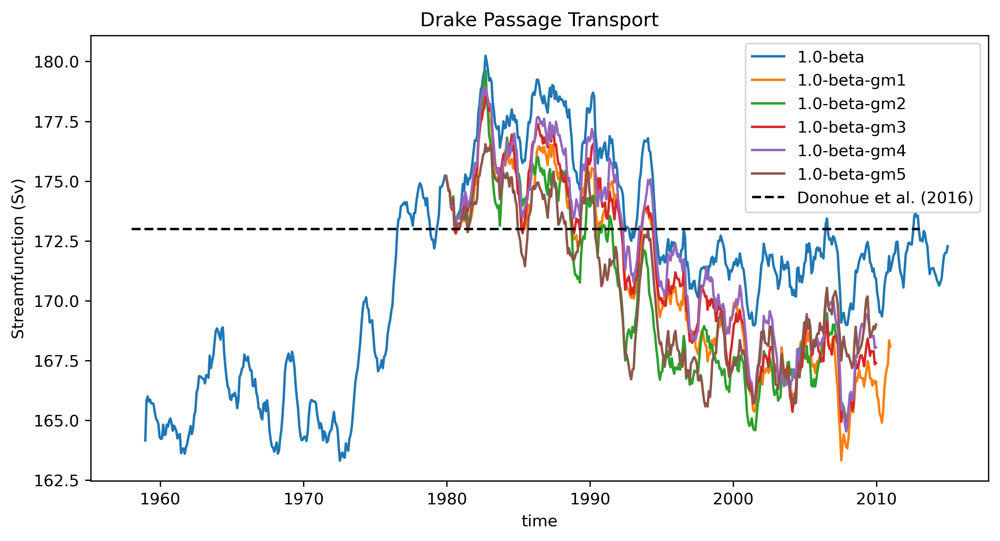

In [14]:
plt.figure(figsize=(10, 5)) 

DP_Trans.rolling(time=12).mean().plot(label='1.0-beta')
DP_Trans_gm1.rolling(time=12).mean().plot(label='1.0-beta-gm1')
DP_Trans_gm2.rolling(time=12).mean().plot(label='1.0-beta-gm2')
DP_Trans_gm3.rolling(time=12).mean().plot(label='1.0-beta-gm3')
DP_Trans_gm4.rolling(time=12).mean().plot(label='1.0-beta-gm4')
DP_Trans_gm5.rolling(time=12).mean().plot(label='1.0-beta-gm5')

plt.plot([cftime.datetime(1958, 1, 1), cftime.datetime(2012, 12, 31)], [173, 173],
           'k--', label="Donohue et al. (2016)")

plt.ylabel('Streamfunction (Sv)')
plt.title('Drake Passage Transport')
plt.legend()

### Summary

### Summary
Not much difference between cases, but weaker GM leads to more eddies and weaker ACC transport.

## Now look at globally averaged timeseries

In [15]:
tosga = datastore.search(variable="tosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['tosga'].resample(time = '1YE').mean('time').load()
sosga = datastore.search(variable="sosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['sosga'].resample(time = '1YE').mean('time').load()

thetaoga = datastore.search(variable="thetaoga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['thetaoga'].resample(time = '1YE').mean('time').load()
tosga_gm1 = datastore_gm1.search(variable="tosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['tosga'].resample(time = '1YE').mean('time').load()
sosga_gm1 = datastore_gm1.search(variable="sosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['sosga'].resample(time = '1YE').mean('time').load()

thetaoga_gm1 = datastore_gm1.search(variable="thetaoga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['thetaoga'].resample(time = '1YE').mean('time').load()

tosga_gm2 = datastore_gm2.search(variable="tosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['tosga'].resample(time = '1YE').mean('time').load()
sosga_gm2 = datastore_gm2.search(variable="sosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['sosga'].resample(time = '1YE').mean('time').load()

thetaoga_gm2 = datastore_gm2.search(variable="thetaoga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['thetaoga'].resample(time = '1YE').mean('time').load()

tosga_gm3 = datastore_gm3.search(variable="tosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['tosga'].resample(time = '1YE').mean('time').load()
sosga_gm3 = datastore_gm3.search(variable="sosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['sosga'].resample(time = '1YE').mean('time').load()

thetaoga_gm3 = datastore_gm3.search(variable="thetaoga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['thetaoga'].resample(time = '1YE').mean('time').load()


tosga_gm4 = datastore_gm4.search(variable="tosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['tosga'].resample(time = '1YE').mean('time').load()
sosga_gm4 = datastore_gm4.search(variable="sosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['sosga'].resample(time = '1YE').mean('time').load()

thetaoga_gm4 = datastore_gm4.search(variable="thetaoga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['thetaoga'].resample(time = '1YE').mean('time').load()


tosga_gm5 = datastore_gm5.search(variable="tosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['tosga'].resample(time = '1YE').mean('time').load()
sosga_gm5 = datastore_gm5.search(variable="sosga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['sosga'].resample(time = '1YE').mean('time').load()

thetaoga_gm5 = datastore_gm5.search(variable="thetaoga").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['thetaoga'].resample(time = '1YE').mean('time').load()

/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. 

Text(0.5, 1.0, '(c) Global average sea surface salinity')

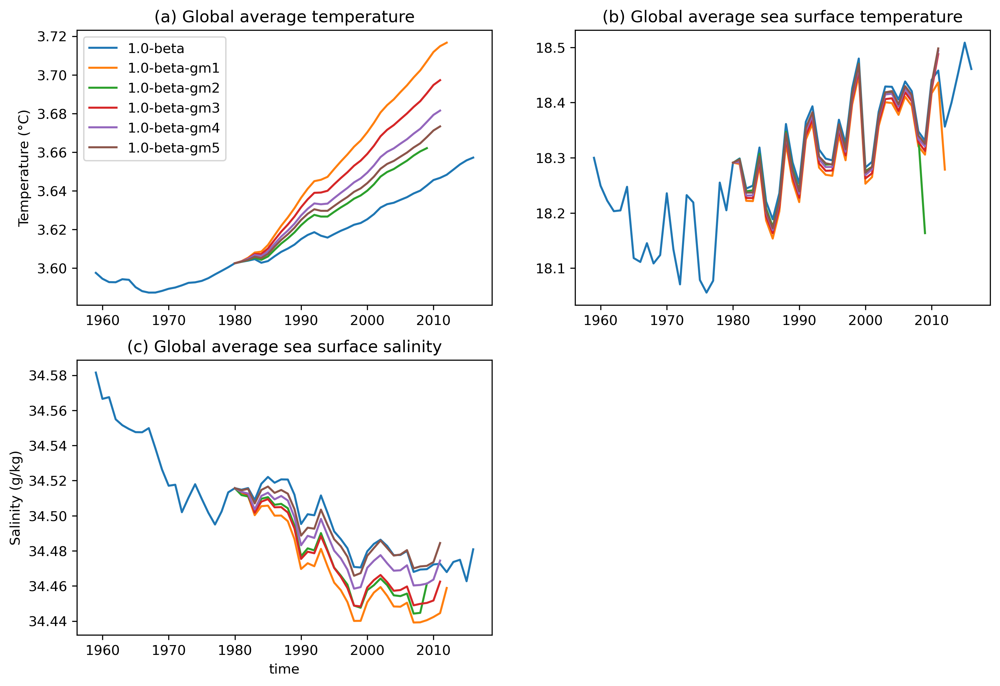

In [16]:
plt.figure(figsize=(12,8))

plt.subplot(221)
thetaoga.plot(label="1.0-beta")
thetaoga_gm1.plot(label="1.0-beta-gm1")
thetaoga_gm2.plot(label="1.0-beta-gm2")
thetaoga_gm3.plot(label="1.0-beta-gm3")
thetaoga_gm4.plot(label="1.0-beta-gm4")
thetaoga_gm5.plot(label="1.0-beta-gm5")
plt.legend()
plt.ylabel('Temperature (°C)')
plt.xlabel('')
plt.title('(a) Global average temperature')

plt.subplot(222)
tosga.plot(label="1.0-beta")
tosga_gm1.plot(label="1.0-beta-gm1")
tosga_gm2.plot(label="1.0-beta-gm2")
tosga_gm3.plot(label="1.0-beta-gm3")
tosga_gm4.plot(label="1.0-beta-gm4")
tosga_gm5.plot(label="1.0-beta-gm5")
plt.ylabel('')
plt.xlabel('')
plt.title('(b) Global average sea surface temperature')

plt.subplot(223)
sosga.plot(label="1.0-beta")
sosga_gm1.plot(label="1.0-beta-gm1")
sosga_gm2.plot(label="1.0-beta-gm2")
sosga_gm3.plot(label="1.0-beta-gm3")
sosga_gm4.plot(label="1.0-beta-gm4")
sosga_gm5.plot(label="1.0-beta-gm5")
plt.ylabel('Salinity (g/kg)')
plt.title('(c) Global average sea surface salinity')

### Summary:
Stronger GM means reduced heat uptake, presumably due to weaker spurious diffusion. But GM4 case still looks OK.

## Next, look at overturning

In [17]:
vmo = datastore.search(variable="vmo").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
).sel(yq=slice(None, 65)) 
vmo_gm1 = datastore_gm1.search(variable="vmo").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
).sel(yq=slice(None, 65)) 

vmo_gm2 = datastore_gm2.search(variable="vmo").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
).sel(yq=slice(None, 65)) 

vmo_gm3 = datastore_gm3.search(variable="vmo").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
).sel(yq=slice(None, 65)) 


vmo_gm4 = datastore_gm4.search(variable="vmo").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
).sel(yq=slice(None, 65)) 


vmo_gm5 = datastore_gm5.search(variable="vmo").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
).sel(yq=slice(None, 65)) 

/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. 

In [18]:
rho0 = 1035  # reference density for OM3
psi = (
    vmo["vmo"]
    .sum("xh")
    .cumsum("rho2_l")
    / rho0
    / 1e6
)
psi_gm1 = (
    vmo_gm1["vmo"]
    .sum("xh")
    .cumsum("rho2_l")
    / rho0
    / 1e6
)

psi_gm2 = (
    vmo_gm2["vmo"]
    .sum("xh")
    .cumsum("rho2_l")
    / rho0
    / 1e6
)

psi_gm3 = (
    vmo_gm3["vmo"]
    .sum("xh")
    .cumsum("rho2_l")
    / rho0
    / 1e6
)

psi_gm4 = (
    vmo_gm4["vmo"]
    .sum("xh")
    .cumsum("rho2_l")
    / rho0
    / 1e6
)

psi_gm5 = (
    vmo_gm5["vmo"]
    .sum("xh")
    .cumsum("rho2_l")
    / rho0
    / 1e6
)

In [19]:
psi_mean = psi.isel(time=slice(-120,)).mean("time").load()
psi_mean_gm1 = psi_gm1.isel(time=slice(-120,)).mean("time").load()
psi_mean_gm2 = psi_gm2.isel(time=slice(-120,)).mean("time").load()
psi_mean_gm3 = psi_gm3.isel(time=slice(-120,)).mean("time").load()
psi_mean_gm4 = psi_gm4.isel(time=slice(-120,)).mean("time").load()
psi_mean_gm5 = psi_gm5.isel(time=slice(-120,)).mean("time").load()

Text(0.5, 1.0, '1.0-beta-gm5')

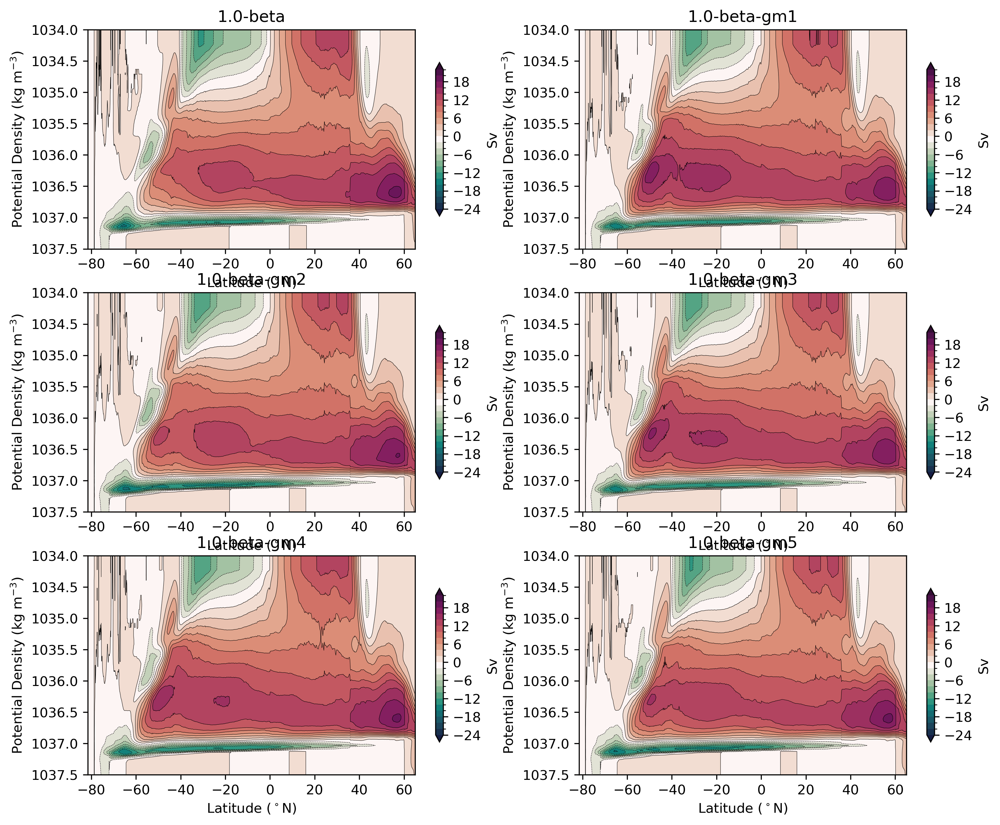

In [20]:
plt.figure(figsize=(12, 10))
levels = range(-24, 24, 2)
plt.subplot(321)
psi_mean.plot.contourf(
    levels=levels, cmap=cm.cm.curl, extend="both",
    cbar_kwargs={"label": "Sv", "shrink": 0.7}
)
psi_mean.plot.contour(levels=levels, colors="k", linewidths=0.25)
plt.gca().invert_yaxis()
plt.ylim((1037.5, 1034))
plt.ylabel("Potential Density (kg m$^{-3}$)")
plt.xlabel("Latitude ($^\circ$N)")
plt.title('1.0-beta')

plt.subplot(322)
psi_mean_gm1.plot.contourf(
    levels=levels, cmap=cm.cm.curl, extend="both",
    cbar_kwargs={"label": "Sv", "shrink": 0.7}
)
psi_mean_gm1.plot.contour(levels=levels, colors="k", linewidths=0.25)
plt.gca().invert_yaxis()
plt.ylim((1037.5, 1034))
plt.ylabel("Potential Density (kg m$^{-3}$)")
plt.xlabel("Latitude ($^\circ$N)")
plt.title('1.0-beta-gm1')


plt.subplot(323)
psi_mean_gm2.plot.contourf(
    levels=levels, cmap=cm.cm.curl, extend="both",
    cbar_kwargs={"label": "Sv", "shrink": 0.7}
)
psi_mean_gm2.plot.contour(levels=levels, colors="k", linewidths=0.25)
plt.gca().invert_yaxis()
plt.ylim((1037.5, 1034))
plt.ylabel("Potential Density (kg m$^{-3}$)")
plt.xlabel("Latitude ($^\circ$N)")
plt.title('1.0-beta-gm2')


plt.subplot(324)
psi_mean_gm3.plot.contourf(
    levels=levels, cmap=cm.cm.curl, extend="both",
    cbar_kwargs={"label": "Sv", "shrink": 0.7}
)
psi_mean_gm3.plot.contour(levels=levels, colors="k", linewidths=0.25)
plt.gca().invert_yaxis()
plt.ylim((1037.5, 1034))
plt.ylabel("Potential Density (kg m$^{-3}$)")
plt.xlabel("Latitude ($^\circ$N)")
plt.title('1.0-beta-gm3')


plt.subplot(325)
psi_mean_gm4.plot.contourf(
    levels=levels, cmap=cm.cm.curl, extend="both",
    cbar_kwargs={"label": "Sv", "shrink": 0.7}
)
psi_mean_gm4.plot.contour(levels=levels, colors="k", linewidths=0.25)
plt.gca().invert_yaxis()
plt.ylim((1037.5, 1034))
plt.ylabel("Potential Density (kg m$^{-3}$)")
plt.xlabel("Latitude ($^\circ$N)")
plt.title('1.0-beta-gm4')


plt.subplot(326)
psi_mean_gm5.plot.contourf(
    levels=levels, cmap=cm.cm.curl, extend="both",
    cbar_kwargs={"label": "Sv", "shrink": 0.7}
)
psi_mean_gm5.plot.contour(levels=levels, colors="k", linewidths=0.25)
plt.gca().invert_yaxis()
plt.ylim((1037.5, 1034))
plt.ylabel("Potential Density (kg m$^{-3}$)")
plt.xlabel("Latitude ($^\circ$N)")
plt.title('1.0-beta-gm5')

In [21]:
psi_40S = (
    psi.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_26N = (
    psi.sel(yq=26, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_55N = (
    psi.sel(yq=5, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_abyss = (
    -psi.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .min(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)

psi_40S_gm1 = (
    psi_gm1.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_26N_gm1 = (
    psi_gm1.sel(yq=26, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_55N_gm1 = (
    psi_gm1.sel(yq=5, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_abyss_gm1 = (
    -psi_gm1.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .min(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)

psi_40S_gm2 = (
    psi_gm2.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_26N_gm2 = (
    psi_gm2.sel(yq=26, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_55N_gm2 = (
    psi_gm2.sel(yq=5, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_abyss_gm2 = (
    -psi_gm2.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .min(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)

psi_40S_gm3 = (
    psi_gm3.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_26N_gm3 = (
    psi_gm3.sel(yq=26, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_55N_gm3 = (
    psi_gm3.sel(yq=5, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_abyss_gm3 = (
    -psi_gm3.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .min(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)

psi_40S_gm4 = (
    psi_gm4.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_26N_gm4 = (
    psi_gm4.sel(yq=26, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_55N_gm4 = (
    psi_gm4.sel(yq=5, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_abyss_gm4 = (
    -psi_gm4.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .min(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)


psi_40S_gm5 = (
    psi_gm5.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_26N_gm5 = (
    psi_gm5.sel(yq=26, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_55N_gm5 = (
    psi_gm5.sel(yq=5, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .max(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)
psi_abyss_gm5 = (
    -psi_gm5.sel(yq=-40, method="nearest")
    .sel(rho2_l=slice(1035, 1038))
    .min(dim="rho2_l")
    .resample(time = '1YE').mean('time')
    .load()
)

Text(0, 0.5, '')

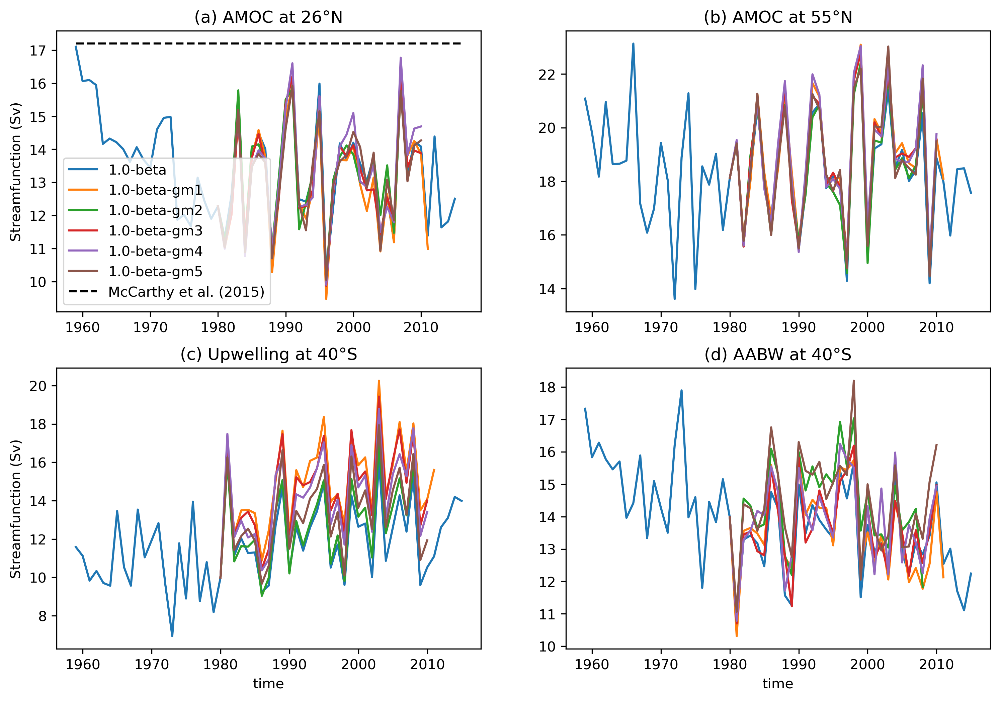

In [22]:
plt.figure(figsize=(12, 8)) 

plt.subplot(221)
psi_26N.plot(label='1.0-beta')
psi_26N_gm1.plot(label='1.0-beta-gm1')
psi_26N_gm2.plot(label='1.0-beta-gm2')
psi_26N_gm3.plot(label='1.0-beta-gm3')
psi_26N_gm4.plot(label='1.0-beta-gm4')
psi_26N_gm5.plot(label='1.0-beta-gm5')
plt.plot([cftime.datetime(1959, 1, 1), cftime.datetime(2015, 12, 31)], [17.2, 17.2],
            'k--', label="McCarthy et al. (2015)")
plt.title('(a) AMOC at 26°N')
plt.ylabel('Streamfunction (Sv)')
plt.legend()
plt.xlabel('')

plt.subplot(222)
psi_55N.plot()
psi_55N_gm1.plot()
psi_55N_gm2.plot()
psi_55N_gm3.plot()
psi_55N_gm4.plot()
psi_55N_gm5.plot()
plt.title('(b) AMOC at 55°N')
plt.ylabel('')
plt.xlabel('')

plt.subplot(223)
psi_40S.plot()
psi_40S_gm1.plot()
psi_40S_gm2.plot()
psi_40S_gm3.plot()
psi_40S_gm4.plot()
psi_40S_gm5.plot()
plt.title('(c) Upwelling at 40°S')
plt.ylabel('Streamfunction (Sv)')

plt.subplot(224)
psi_abyss.plot()
psi_abyss_gm1.plot()
psi_abyss_gm2.plot()
psi_abyss_gm3.plot()
psi_abyss_gm4.plot()
psi_abyss_gm5.plot()
plt.title('(d) AABW at 40°S')
plt.ylabel('')

### Summary:
* The AMOC and abyssal cells are not sensitive to GM.
* The main issue is in the Southern Ocean upwelling branch of the upper cell. Stronger GM/Redi means that the upwelling is less adiabatic, zero GM leads to recirculation in the south.
*  On balance, GM4 looks the best here, and **this is the main metric which we will probably make a decision on**.

## Looking at eddy statistics via SSH variance

In [23]:
zos = datastore.search(variable="zos").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
zossq = datastore.search(variable="zossq").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
zos_gm1 = datastore_gm1.search(variable="zos").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
zossq_gm1 = datastore_gm1.search(variable="zossq").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
zos_gm2 = datastore_gm2.search(variable="zos").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
zossq_gm2 = datastore_gm2.search(variable="zossq").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
zos_gm3 = datastore_gm3.search(variable="zos").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
zossq_gm3 = datastore_gm3.search(variable="zossq").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
zos_gm4 = datastore_gm4.search(variable="zos").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
zossq_gm4 = datastore_gm4.search(variable="zossq").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)

zos_gm5 = datastore_gm5.search(variable="zos").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)
zossq_gm5 = datastore_gm5.search(variable="zossq").to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)

/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. 

In [24]:
zos_mean = zos['zos'].isel(time=slice(-120,)).mean("time").load()
zossq_mean = zossq['zossq'].isel(time=slice(-120,)).mean("time").load()
sshstd = (zossq_mean - (zos_mean**2))**(0.5)

zos_mean_gm1 = zos_gm1['zos'].isel(time=slice(-120,)).mean("time").load()
zossq_mean_gm1 = zossq_gm1['zossq'].isel(time=slice(-120,)).mean("time").load()
sshstd_gm1 = (zossq_mean_gm1 - (zos_mean_gm1**2))**(0.5)

zos_mean_gm2 = zos_gm2['zos'].isel(time=slice(-120,)).mean("time").load()
zossq_mean_gm2 = zossq_gm2['zossq'].isel(time=slice(-120,)).mean("time").load()
sshstd_gm2 = (zossq_mean_gm2 - (zos_mean_gm2**2))**(0.5)

zos_mean_gm3 = zos_gm3['zos'].isel(time=slice(-120,)).mean("time").load()
zossq_mean_gm3 = zossq_gm3['zossq'].isel(time=slice(-120,)).mean("time").load()
sshstd_gm3 = (zossq_mean_gm3 - (zos_mean_gm3**2))**(0.5)

zos_mean_gm4 = zos_gm4['zos'].isel(time=slice(-120,)).mean("time").load() 
zossq_mean_gm4 = zossq_gm4['zossq'].isel(time=slice(-120,)).mean("time").load()
sshstd_gm4 = (zossq_mean_gm4 - (zos_mean_gm4**2))**(0.5)

zos_mean_gm5 = zos_gm5['zos'].isel(time=slice(-120,)).mean("time").load() 
zossq_mean_gm5 = zossq_gm5['zossq'].isel(time=slice(-120,)).mean("time").load()
sshstd_gm5 = (zossq_mean_gm5 - (zos_mean_gm5**2))**(0.5)

Text(0.5, 1.0, '1.0-beta_gm5')

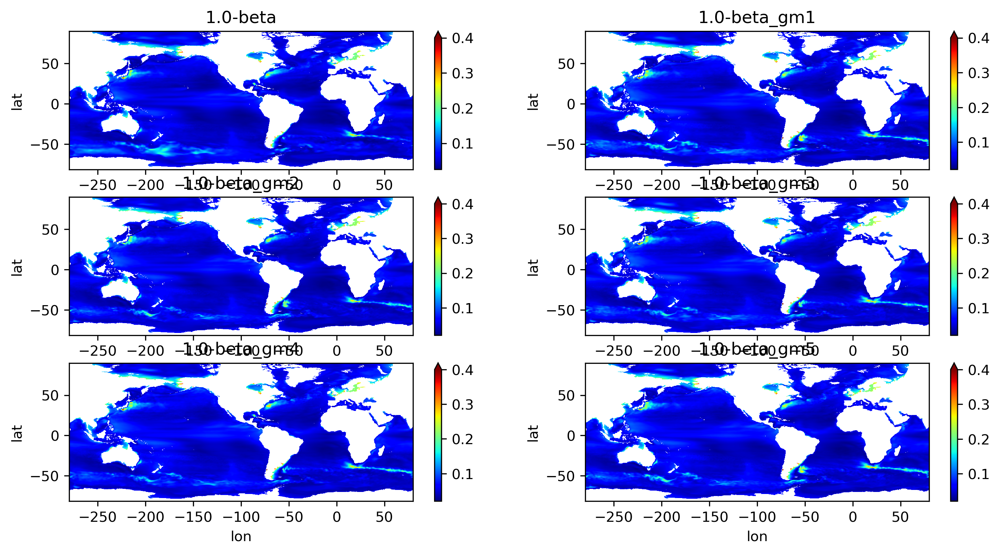

In [25]:
plt.figure(figsize=(12, 6)) 

plt.subplot(321)
sshstd.plot(vmax=0.4,cmap='jet')
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta')

plt.subplot(322)
sshstd_gm1.plot(vmax=0.4,cmap='jet')
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta_gm1')

plt.subplot(323)
sshstd_gm2.plot(vmax=0.4,cmap='jet')
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta_gm2')

plt.subplot(324)
sshstd_gm3.plot(vmax=0.4,cmap='jet')
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta_gm3')

plt.subplot(325)
sshstd_gm4.plot(vmax=0.4,cmap='jet')
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta_gm4')


plt.subplot(326)
sshstd_gm5.plot(vmax=0.4,cmap='jet')
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta_gm5')

### Summary:
* default cases looks like it has weaker eddies, noting that there is also other timescales of varaibility captured here
* GM4 is sufficient here.

## Look at time-mean surface currents to see if GM alters WBC separation, etc.

In [26]:
speed = datastore.search(variable="speed",frequency='1mon').to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['speed'].isel(time=slice(-120,)).mean("time").load()

speed_gm1 = datastore_gm1.search(variable="speed",frequency='1mon').to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['speed'].isel(time=slice(-120,)).mean("time").load()

speed_gm2 = datastore_gm2.search(variable="speed",frequency='1mon').to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['speed'].isel(time=slice(-120,)).mean("time").load()

speed_gm3 = datastore_gm3.search(variable="speed",frequency='1mon').to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['speed'].isel(time=slice(-120,)).mean("time").load()

speed_gm4 = datastore_gm4.search(variable="speed",frequency='1mon').to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['speed'].isel(time=slice(-120,)).mean("time").load() 

speed_gm5 = datastore_gm5.search(variable="speed",frequency='1mon').to_dask(
    xarray_open_kwargs = dict(
        chunks={"time": -1},
        decode_timedelta=True
    )
)['speed'].isel(time=slice(-120,)).mean("time").load() 

/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  records = grouped.get_group(internal_key).to_dict(orient='records')
/g/data/xp65/public/apps/med_conda/envs/analysis3-25.09/lib/python3.11/site-packages/intake_esm/core.py:321: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. 

Text(0.5, 1.0, '1.0-beta_gm5')

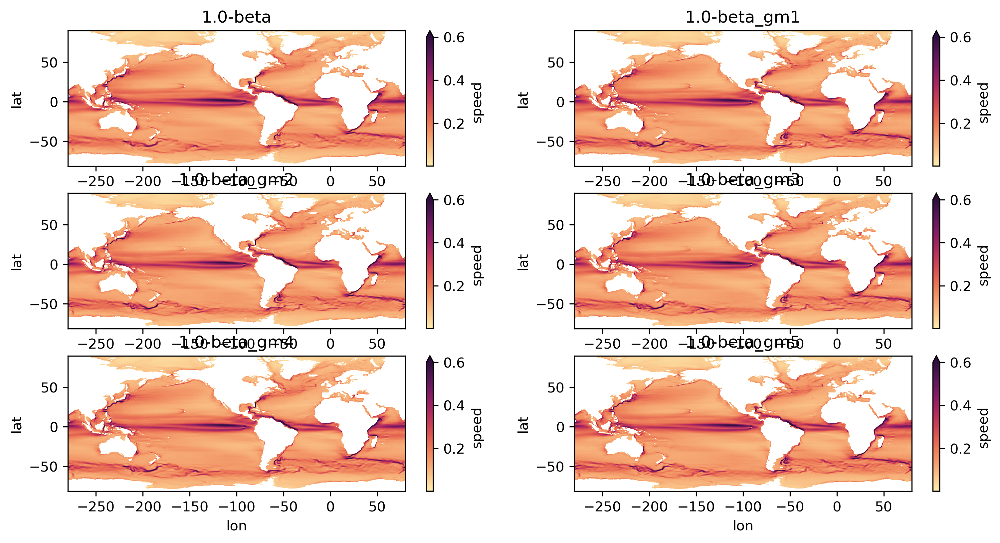

In [27]:
plt.figure(figsize=(12, 6)) 

plt.subplot(321)
speed.plot(vmax=0.6,cmap=cm.cm.matter)
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta')

plt.subplot(322)
speed_gm1.plot(vmax=0.6,cmap=cm.cm.matter)
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta_gm1')

plt.subplot(323)
speed_gm2.plot(vmax=0.6,cmap=cm.cm.matter)
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta_gm2')

plt.subplot(324)
speed_gm3.plot(vmax=0.6,cmap=cm.cm.matter)
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta_gm3')


plt.subplot(325)
speed_gm4.plot(vmax=0.6,cmap=cm.cm.matter)
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta_gm4')


plt.subplot(326)
speed_gm5.plot(vmax=0.6,cmap=cm.cm.matter)
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta_gm5')

Text(0.5, 1.0, '1.0-beta_gm5')

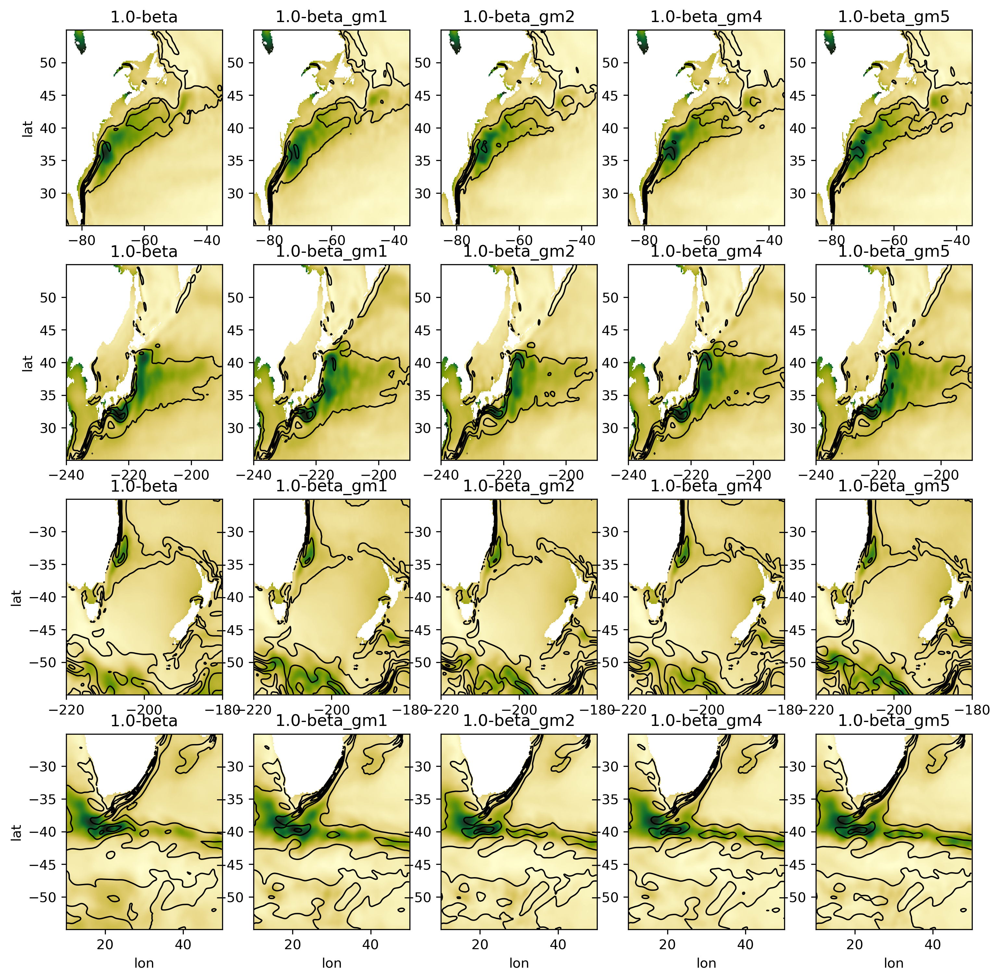

In [28]:
plt.figure(figsize=(12, 12)) 

plt.subplot(451)
speed.sel(xh=slice(-85,-35)).sel(yh=slice(25,55)).plot.contour(colors='k',linewidths=1)
sshstd.sel(xh=slice(-85,-35)).sel(yh=slice(25,55)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('lat')
plt.xlabel('')
plt.title('1.0-beta')

plt.subplot(452)
speed_gm1.sel(xh=slice(-85,-35)).sel(yh=slice(25,55)).plot.contour(colors='k',linewidths=1)
sshstd_gm1.sel(xh=slice(-85,-35)).sel(yh=slice(25,55)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm1')

plt.subplot(453)
speed_gm2.sel(xh=slice(-85,-35)).sel(yh=slice(25,55)).plot.contour(colors='k',linewidths=1)
sshstd_gm2.sel(xh=slice(-85,-35)).sel(yh=slice(25,55)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm2')

plt.subplot(454)
speed_gm4.sel(xh=slice(-85,-35)).sel(yh=slice(25,55)).plot.contour(colors='k',linewidths=1)
sshstd_gm4.sel(xh=slice(-85,-35)).sel(yh=slice(25,55)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm4')

plt.subplot(455)
speed_gm5.sel(xh=slice(-85,-35)).sel(yh=slice(25,55)).plot.contour(colors='k',linewidths=1)
sshstd_gm5.sel(xh=slice(-85,-35)).sel(yh=slice(25,55)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm5')

plt.subplot(456)
speed.sel(xh=slice(-240,-190)).sel(yh=slice(25,55)).plot.contour(colors='k',linewidths=1)
sshstd.sel(xh=slice(-240,-190)).sel(yh=slice(25,55)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('lat')
plt.xlabel('')
plt.title('1.0-beta')

plt.subplot(457)
speed_gm1.sel(xh=slice(-240,-190)).sel(yh=slice(25,55)).plot.contour(colors='k',linewidths=1)
sshstd_gm1.sel(xh=slice(-240,-190)).sel(yh=slice(25,55)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm1')

plt.subplot(458)
speed_gm2.sel(xh=slice(-240,-190)).sel(yh=slice(25,55)).plot.contour(colors='k',linewidths=1)
sshstd_gm2.sel(xh=slice(-240,-190)).sel(yh=slice(25,55)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm2')

plt.subplot(459)
speed_gm4.sel(xh=slice(-240,-190)).sel(yh=slice(25,55)).plot.contour(colors='k',linewidths=1)
sshstd_gm4.sel(xh=slice(-240,-190)).sel(yh=slice(25,55)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm4')

plt.subplot(4,5,10)
speed_gm5.sel(xh=slice(-240,-190)).sel(yh=slice(25,55)).plot.contour(colors='k',linewidths=1)
sshstd_gm5.sel(xh=slice(-240,-190)).sel(yh=slice(25,55)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm5')

plt.subplot(4,5,11)
speed.sel(xh=slice(-220,-180)).sel(yh=slice(-55,-25)).plot.contour(colors='k',linewidths=1)
sshstd.sel(xh=slice(-220,-180)).sel(yh=slice(-55,-25)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('lat')
plt.xlabel('')
plt.title('1.0-beta')

plt.subplot(4,5,12)
speed_gm1.sel(xh=slice(-220,-180)).sel(yh=slice(-55,-25)).plot.contour(colors='k',linewidths=1)
sshstd_gm1.sel(xh=slice(-220,-180)).sel(yh=slice(-55,-25)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm1')

plt.subplot(4,5,13)
speed_gm2.sel(xh=slice(-220,-180)).sel(yh=slice(-55,-25)).plot.contour(colors='k',linewidths=1)
sshstd_gm2.sel(xh=slice(-220,-180)).sel(yh=slice(-55,-25)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm2')

plt.subplot(4,5,14)
speed_gm4.sel(xh=slice(-220,-180)).sel(yh=slice(-55,-25)).plot.contour(colors='k',linewidths=1)
sshstd_gm4.sel(xh=slice(-220,-180)).sel(yh=slice(-55,-25)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm4')

plt.subplot(4,5,15)
speed_gm5.sel(xh=slice(-220,-180)).sel(yh=slice(-55,-25)).plot.contour(colors='k',linewidths=1)
sshstd_gm5.sel(xh=slice(-220,-180)).sel(yh=slice(-55,-25)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('')
plt.title('1.0-beta_gm5')

plt.subplot(4,5,16)
speed.sel(xh=slice(10,50)).sel(yh=slice(-55,-25)).plot.contour(colors='k',linewidths=1)
sshstd.sel(xh=slice(10,50)).sel(yh=slice(-55,-25)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('lat')
plt.xlabel('lon')
plt.title('1.0-beta')

plt.subplot(4,5,17)
speed_gm1.sel(xh=slice(10,50)).sel(yh=slice(-55,-25)).plot.contour(colors='k',linewidths=1)
sshstd_gm1.sel(xh=slice(10,50)).sel(yh=slice(-55,-25)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('lon')
plt.title('1.0-beta_gm1')

plt.subplot(4,5,18)
speed_gm2.sel(xh=slice(10,50)).sel(yh=slice(-55,-25)).plot.contour(colors='k',linewidths=1)
sshstd_gm2.sel(xh=slice(10,50)).sel(yh=slice(-55,-25)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('lon')
plt.title('1.0-beta_gm2')

plt.subplot(4,5,19)
speed_gm4.sel(xh=slice(10,50)).sel(yh=slice(-55,-25)).plot.contour(colors='k',linewidths=1)
sshstd_gm4.sel(xh=slice(10,50)).sel(yh=slice(-55,-25)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('lon')
plt.title('1.0-beta_gm4')

plt.subplot(4,5,20)
speed_gm5.sel(xh=slice(10,50)).sel(yh=slice(-55,-25)).plot.contour(colors='k',linewidths=1)
sshstd_gm5.sel(xh=slice(10,50)).sel(yh=slice(-55,-25)).plot(vmax=0.3,cmap=cm.cm.speed,add_colorbar=False)
plt.ylabel('')
plt.xlabel('lon')
plt.title('1.0-beta_gm5')

### Summary:
* The GM coefficients make only a small difference to surface time-mean currents.
* Not clear that there is a change in the separation behaviour with GM5 - perhaps we need a stronger negative coefficient here?
* Otherwise, if there are separation biases we may need another dial to play with.

## Overall recommendation
The parameters used for GM4 seem the best balance here. This recommendation is based on:
* having similar GM & Redi coefficients to previous work with ACCESS-OM2,
* allowing for eddies and jets to form in the Southern Ocean,
* most critically, maintaining a near-adiabatic upper cell upwelling branch of the overturning in the southern ocean.

In [5]:
client.close()